### This notebook uses grad-cam code from the repository [Grad-CAM](https://github.com/jacobgil/pytorch-grad-cam.git), available under the MIT license.

# The main idea of the method:<br/> 1) Take a relatively small CNN which was trained on the given dataset, or take a pre-trained network and fine-tune it.<br/> 2) Hook the Grad-CAM to its last conv layer and collect all gradients after one-time forward pass through the network with respect to the output class.<br/> 3) Get the activation maps, threshold the values which made small to no impact on the prediction, and get a bounding box over the area of most activation.<br/> 4) Patching: take the activation bounding box and make a dense grid over the area. The rest of the image should be patched as well, but less densely.<br/> 5) Take the image patched in such a way and use it as the input to the ViT.

### During the training process of our ViT we may take gradients with respect to the correct class of the training examples (even if the CNN model makes a wrong prediction). But during the validation process we should let the CNN model decide, which class is the most probable one for each validation example (we simulate no previous knowledge of labels).

# We will be working on the Flowers102 dataset and using the ResNet18 model pre-trained on ImageNet1k.

In [2]:
from torchvision.models import resnet18, ResNet18_Weights
from torch.utils.data import Dataset
import torchvision
from torchvision import transforms
from torch.utils.data import DataLoader
from tqdm import tqdm
import cv2
import torch
import numpy as np
import torch.nn as nn
import matplotlib.patches as patches

import matplotlib.pyplot as plt
from torchvision.datasets import Flowers102

try:
    import pytorch_grad_cam
except ModuleNotFoundError:
    !pip install -q grad-cam

from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import (
    show_cam_on_image, deprocess_image, preprocess_image
)

# Define a CustomDataset class to load the augmentations easier (as in Szymon's code)

In [3]:
class CustomDataset(Dataset):
    def __init__(self, base_dataset, split, sampler=None):
        self.base_dataset = base_dataset
        self.split = split
        self.augmentations = self._get_augmentations()

    def _get_augmentations(self):
        train_transforms = [
            transforms.Resize((224, 224)),
            transforms.ToTensor(),
            transforms.RandomHorizontalFlip(),
            transforms.RandomVerticalFlip(),
            transforms.RandomRotation(degrees=(-45, 45)),
            transforms.RandomApply([transforms.GaussianBlur(kernel_size=5)], p=0.5),
            transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
        ]
        test_transforms = [
            transforms.Resize((224, 224)),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
        ]

        if self.split == 'train':
            return transforms.Compose(train_transforms)
        else:
            return transforms.Compose(test_transforms)

    def __len__(self):
        return len(self.base_dataset)

    def __getitem__(self, idx):
        image, label = self.base_dataset[idx]
        image = self.augmentations(image)

        return image, label

# Load the Flowers Dataset

In [4]:
base_train_dataset = Flowers102('Flowers102', split='train', download=True)
base_val_dataset = Flowers102('Flowers102', split='val', download=True)
flowers_train_dataset = CustomDataset(base_train_dataset, 'train')
flowers_valid_dataset = CustomDataset(base_val_dataset, 'val')

100%|██████████| 344862509/344862509 [00:05<00:00, 68806655.98it/s]


Extracting Flowers102/flowers-102/102flowers.tgz to Flowers102/flowers-102


100%|██████████| 502/502 [00:00<00:00, 593110.03it/s]


100%|██████████| 14989/14989 [00:00<00:00, 15936228.81it/s]


# Get the DataLoaders with an appropriate batch size

In [5]:
batch_size = 32  # Set an appropriate batch size
train_loader = DataLoader(flowers_train_dataset, batch_size=batch_size, shuffle=True)
valid_loader = DataLoader(flowers_valid_dataset, batch_size=batch_size, shuffle=False)

# Switch the old ResNet18 decision head for a new one, with an appropriate number of output classes

In [6]:
model = resnet18(weights=ResNet18_Weights.IMAGENET1K_V1)
model.fc = nn.Linear(in_features = model.fc.in_features, out_features=102, bias=True)  # reset the classification head
model.fc

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 157MB/s]


Linear(in_features=512, out_features=102, bias=True)

# Freeze all the blocks, except for the decision head

In [8]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

# freeze all the previous parameters, only teach the new decision head
for p in model.parameters():
    p.requires_grad = False

model.fc.weight.requires_grad = True
model.fc.bias.requires_grad = True

# Use linear-probing --> train the linear decision head on top of the frozen backbone

In [9]:
criterion = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.AdamW(model.parameters(), lr=1e-2)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.1)
epochs = 30

for epoch in range(epochs):
    running_loss = 0.0
    model.train()
    train_correct = 0
    train_outputs = 0
    for i, data in enumerate(tqdm(train_loader), 0):
        images, labels = data
        labels, images = labels.to(device), images.to(device)
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        train_correct += (torch.argmax(outputs, dim=-1) == labels).sum().item()
        train_outputs += outputs.shape[0]
        running_loss += loss
    scheduler.step()

    model.eval()
    total_correct = 0
    total_outputs = 0
    with torch.no_grad():
        for i, data in enumerate(tqdm(valid_loader), 0):
            images, labels = data
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            correct = (torch.argmax(outputs, dim=-1) == labels).sum().item()
            total_correct += correct
            total_outputs += outputs.shape[0]
    print(f"[Epoch {epoch + 1}] Loss: {running_loss / i:.3f}, Train Acc: {train_correct/train_outputs:.3f}, Valid Acc: {total_correct/total_outputs:.3f}")

torch.save(model.state_dict(), 'resnet18-flowers102.pt')

100%|██████████| 32/32 [00:07<00:00,  4.34it/s]


[Epoch 1] Loss: 6.364, Train Acc: 0.121, Valid Acc: 0.359


100%|██████████| 32/32 [00:07<00:00,  4.04it/s]


[Epoch 2] Loss: 2.549, Train Acc: 0.474, Valid Acc: 0.512


100%|██████████| 32/32 [00:07<00:00,  4.27it/s]


[Epoch 3] Loss: 1.539, Train Acc: 0.644, Valid Acc: 0.576


100%|██████████| 32/32 [00:09<00:00,  3.55it/s]


[Epoch 4] Loss: 1.082, Train Acc: 0.725, Valid Acc: 0.545


100%|██████████| 32/32 [00:08<00:00,  3.61it/s]


[Epoch 5] Loss: 0.974, Train Acc: 0.756, Valid Acc: 0.601


100%|██████████| 32/32 [00:10<00:00,  3.15it/s]


[Epoch 6] Loss: 0.892, Train Acc: 0.786, Valid Acc: 0.601


100%|██████████| 32/32 [00:09<00:00,  3.35it/s]


[Epoch 7] Loss: 0.703, Train Acc: 0.812, Valid Acc: 0.619


100%|██████████| 32/32 [00:07<00:00,  4.52it/s]


[Epoch 8] Loss: 0.755, Train Acc: 0.784, Valid Acc: 0.642


100%|██████████| 32/32 [00:07<00:00,  4.02it/s]


[Epoch 9] Loss: 0.715, Train Acc: 0.821, Valid Acc: 0.662


100%|██████████| 32/32 [00:06<00:00,  4.61it/s]


[Epoch 10] Loss: 0.573, Train Acc: 0.838, Valid Acc: 0.672


100%|██████████| 32/32 [00:08<00:00,  3.59it/s]


[Epoch 11] Loss: 0.242, Train Acc: 0.932, Valid Acc: 0.743


100%|██████████| 32/32 [00:09<00:00,  3.26it/s]


[Epoch 12] Loss: 0.199, Train Acc: 0.944, Valid Acc: 0.753


100%|██████████| 32/32 [00:08<00:00,  3.90it/s]


[Epoch 13] Loss: 0.164, Train Acc: 0.956, Valid Acc: 0.745


100%|██████████| 32/32 [00:08<00:00,  3.58it/s]


[Epoch 14] Loss: 0.164, Train Acc: 0.959, Valid Acc: 0.759


100%|██████████| 32/32 [00:10<00:00,  3.09it/s]


[Epoch 15] Loss: 0.136, Train Acc: 0.969, Valid Acc: 0.750


100%|██████████| 32/32 [00:08<00:00,  3.67it/s]


[Epoch 16] Loss: 0.169, Train Acc: 0.957, Valid Acc: 0.757


100%|██████████| 32/32 [00:08<00:00,  3.65it/s]


[Epoch 17] Loss: 0.152, Train Acc: 0.971, Valid Acc: 0.780


100%|██████████| 32/32 [00:09<00:00,  3.40it/s]


[Epoch 18] Loss: 0.142, Train Acc: 0.961, Valid Acc: 0.762


100%|██████████| 32/32 [00:07<00:00,  4.40it/s]


[Epoch 19] Loss: 0.139, Train Acc: 0.962, Valid Acc: 0.764


100%|██████████| 32/32 [00:08<00:00,  3.71it/s]


[Epoch 20] Loss: 0.129, Train Acc: 0.970, Valid Acc: 0.761


100%|██████████| 32/32 [00:07<00:00,  4.01it/s]


[Epoch 21] Loss: 0.141, Train Acc: 0.966, Valid Acc: 0.770


100%|██████████| 32/32 [00:08<00:00,  3.80it/s]


[Epoch 22] Loss: 0.144, Train Acc: 0.965, Valid Acc: 0.775


100%|██████████| 32/32 [00:07<00:00,  4.53it/s]


[Epoch 23] Loss: 0.123, Train Acc: 0.974, Valid Acc: 0.773


100%|██████████| 32/32 [00:07<00:00,  4.25it/s]


[Epoch 24] Loss: 0.139, Train Acc: 0.965, Valid Acc: 0.767


100%|██████████| 32/32 [00:10<00:00,  2.93it/s]


[Epoch 25] Loss: 0.127, Train Acc: 0.971, Valid Acc: 0.775


100%|██████████| 32/32 [00:08<00:00,  3.95it/s]


[Epoch 26] Loss: 0.124, Train Acc: 0.971, Valid Acc: 0.766


100%|██████████| 32/32 [00:07<00:00,  4.29it/s]


[Epoch 27] Loss: 0.126, Train Acc: 0.969, Valid Acc: 0.775


100%|██████████| 32/32 [00:08<00:00,  3.86it/s]


[Epoch 28] Loss: 0.117, Train Acc: 0.974, Valid Acc: 0.770


100%|██████████| 32/32 [00:07<00:00,  4.03it/s]


[Epoch 29] Loss: 0.136, Train Acc: 0.966, Valid Acc: 0.775


100%|██████████| 32/32 [00:06<00:00,  4.62it/s]


[Epoch 30] Loss: 0.116, Train Acc: 0.972, Valid Acc: 0.771


# Load the previously saved model - useful for testing purposes

In [10]:
model = resnet18(weights=ResNet18_Weights.IMAGENET1K_V1)
model.fc = nn.Linear(in_features = model.fc.in_features, out_features=102, bias=True)

model.load_state_dict(torch.load('./resnet18-flowers102.pt'))

<All keys matched successfully>

# Visualize some examples from the dataset

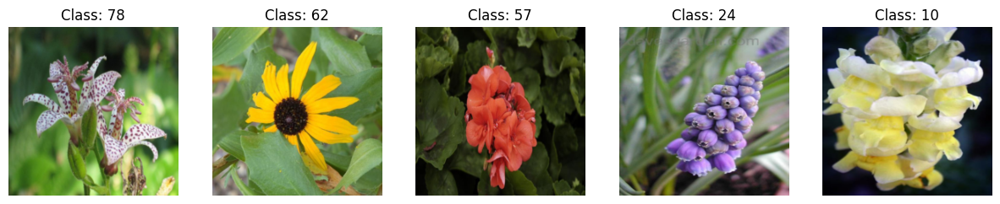

In [14]:
transform = torchvision.transforms.Compose([transforms.Resize((224, 224)),
                                            transforms.PILToTensor()],)

batch_size = 5
_train_dataset = Flowers102('Flowers102', split='train', download=True, transform=transform)
_loader = DataLoader(_train_dataset, batch_size=batch_size, shuffle=True)

for imgs, labels in _loader:
    break

fig, ax = plt.subplots(1, 5, figsize=(15,10))

for i in range(batch_size):
    img = (imgs[i] / 255).squeeze(0)
    img = np.transpose(img.numpy(), (1, 2, 0))
    ax[i].imshow(img)
    ax[i].set_title(f"Class: {int(labels[i])}")
    ax[i].axis('off')
plt.show()

# Add a basic helper function for drawing the patches

In [15]:
def get_rectangles(x: int, y: int, w: int, h: int, size: tuple=(16,16), color: str='lightgreen') -> list:
    list_of_rectangles = []

    for i in range(w // size[0]):
        for j in range(h // size[1]):
            x_temp, y_temp = x + i*size[0], y + j*size[1]
            w_temp, h_temp = size
            list_of_rectangles.append(patches.Rectangle((x_temp, y_temp), w_temp, h_temp, fill=False, color=color, linewidth=1))
    return list_of_rectangles

# Nowe let's visualize the method using grid in-box 8x8 patching, and 32x32 resolution patches for the rest of the image.

In [43]:
from typing import Tuple

def visualize_patching(model: nn.Module, patch_size: Tuple[int, int]=(8, 8), bigger_grid_patch_size: Tuple[int, int]=(32, 32),
                      batch_size: int = 10, threshold: int = 150, mode: str = 'val'):

    torch.manual_seed(20)
    model.eval()

    # unfreeze all the parameters - needs to be done so that the grad-cam can work
    for p in model.parameters():
        p.requires_grad = True

    target_layers = [model.layer4]
    transform = torchvision.transforms.Compose([transforms.Resize((224, 224)),
                                                transforms.PILToTensor()],)

    dataset = Flowers102('Flowers102', split=mode, download=True, transform=transform)
    loader = DataLoader(dataset, batch_size=batch_size, shuffle=True)

    for img, label in loader:
        break


    for i in range(batch_size):

      rgb_img = (img[i] / 255).squeeze(0)
      rgb_img = np.transpose(rgb_img.numpy(), (1, 2, 0))

      input_tensor = preprocess_image(rgb_img,
                                      mean=[0.485, 0.456, 0.406],
                                      std=[0.229, 0.224, 0.225])

      # Construct the CAM object once, and then re-use it on many images:
      cam = GradCAM(model=model, target_layers=target_layers, use_cuda=(device.type=='cuda'))
      cam.batch_size = 1

      output = model(input_tensor.to(device))
      pred_label = torch.argmax(output, dim=-1).item()

      if mode == 'train':
          targets = [ClassifierOutputTarget(label[i].item())]  # When we know the label --> during training
      else:
          targets = None  # When we don't have the label --> during validation and testing --> will take the label from argmax

      # Can also pass aug_smooth=True and eigen_smooth=True, to apply smoothing.
      grayscale_cam = cam(input_tensor=input_tensor,
                          targets=targets,
                          aug_smooth=True)

      # In this example grayscale_cam has only one image in the batch:
      grayscale_cam = grayscale_cam[0, :]
      visualization = show_cam_on_image(rgb_img, grayscale_cam, use_rgb=True)

      plt.imshow(rgb_img)
      plt.title(f"Class: {int(label[i])}")
      plt.axis('off')
      plt.show()

      gray = (grayscale_cam * 255).astype("uint8")
      thresh = cv2.threshold(gray, threshold, 255, cv2.THRESH_BINARY)[1]

      # Find contours
      cnts = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
      cnts = cnts[0] if len(cnts) == 2 else cnts[1]

      fig, ax = plt.subplots(1,1, figsize=(5,5))
      ax.imshow(visualization)

      if len(cnts) == 0:
          x,y,w,h = 0, 0, 224, 224
          ax.add_patch(patches.Rectangle((1, 1), w-4, h-4, fill=False, color='white', linewidth=3))
          rectangles = get_rectangles(0, 0, 224, 224, size=bigger_grid_patch_size, color='white')
          for rectangle in rectangles:
              ax.add_patch(rectangle)
          # print(f"Rectangle's left upper corner coords: (X,Y)=({x},{y}), size {w}x{h}")

      else:
          _rectangles = get_rectangles(0, 0, 224, 224, size=bigger_grid_patch_size, color='black')
          for _rectangle in _rectangles:
              ax.add_patch(_rectangle)
          for c in cnts:
              x,y,w,h = cv2.boundingRect(c)

              # we do not care about small bounding-boxes
              if (w, h) < (16, 16):
                  continue

              if bigger_grid_patch_size[0] - x % bigger_grid_patch_size[0] >= x % bigger_grid_patch_size[0]:
                  x = x - x % bigger_grid_patch_size[0]
              else:
                  x = x + (bigger_grid_patch_size[0] - x % bigger_grid_patch_size[0])

              if bigger_grid_patch_size[1] - y % bigger_grid_patch_size[1] >= y % bigger_grid_patch_size[1]:
                  y = y - y % bigger_grid_patch_size[1]
              else:
                  y = y + (bigger_grid_patch_size[1] - y % bigger_grid_patch_size[1])


              if bigger_grid_patch_size[0] - w % bigger_grid_patch_size[0] >= w % bigger_grid_patch_size[0] and w - w % bigger_grid_patch_size[0] > 0:
                  w = w - w % bigger_grid_patch_size[0]
              else:
                  w = w + (bigger_grid_patch_size[0] - w % bigger_grid_patch_size[0])

              if bigger_grid_patch_size[1] - h % bigger_grid_patch_size[1] >= h % bigger_grid_patch_size[1] and  h - h % bigger_grid_patch_size[1] > 0:
                  h = h - h % bigger_grid_patch_size[1]
              else:
                  h = h + (bigger_grid_patch_size[1] - h % bigger_grid_patch_size[1])


              ax.add_patch(patches.Rectangle((x, y), w, h, fill=False, color='white', linewidth=2))
              rectangles = get_rectangles(x, y, w, h, size=patch_size, color='white')
              for rectangle in rectangles:
                  ax.add_patch(rectangle)
              # print(f"Rectangle's left upper corner coords: (X,Y)=({x},{y}), size {w}x{h}")

      ax.set_title('Activation Bounding Box With Patches')
      ax.axis('off')
      plt.show()

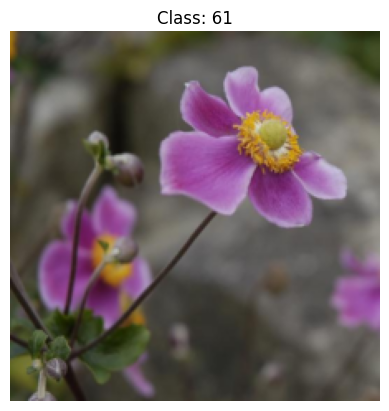

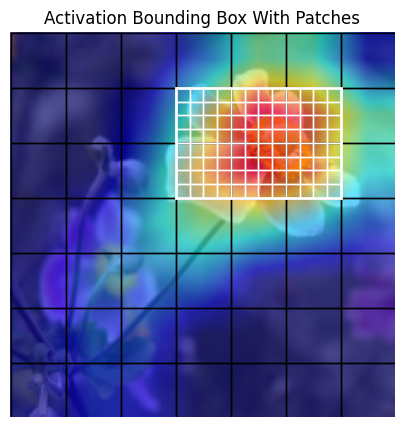

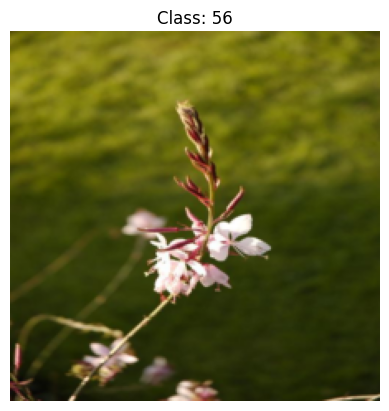

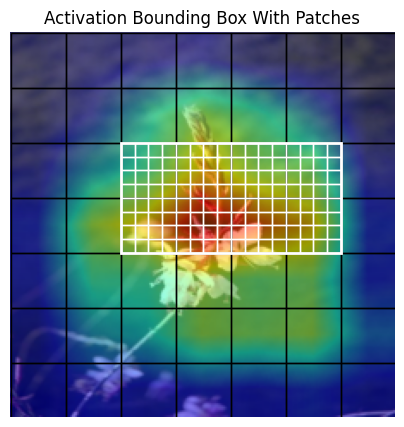

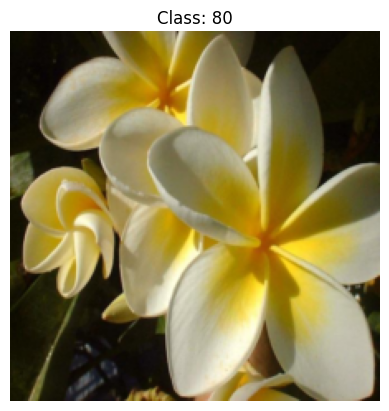

...

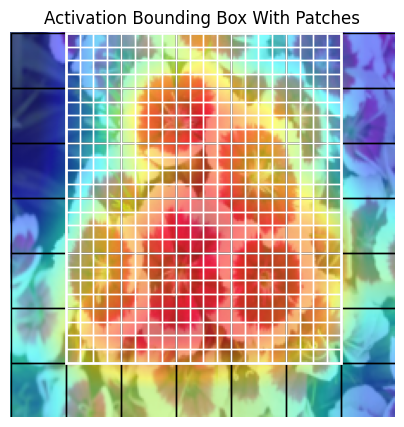

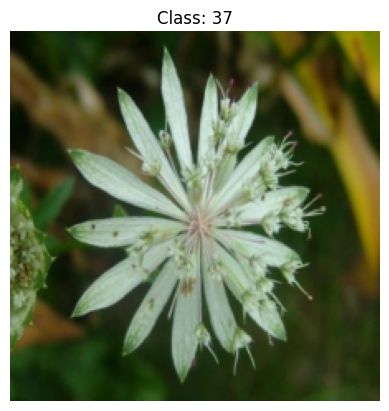

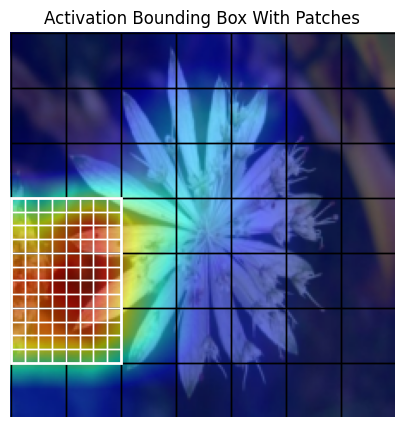

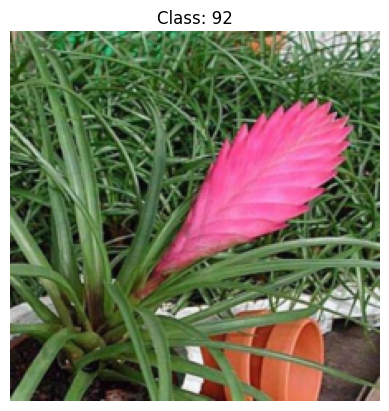

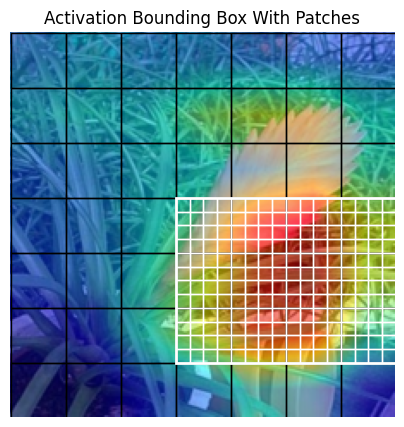

In [45]:
visualize_patching(model, threshold=150)

# Now the same done for small patches of size 14x14 ang large patches of size 56x56

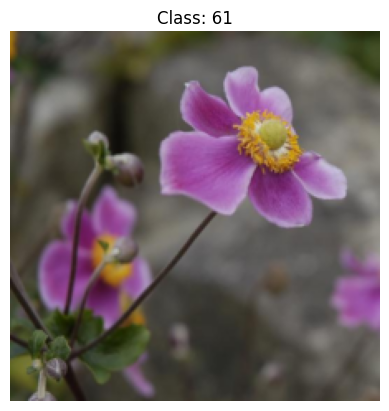

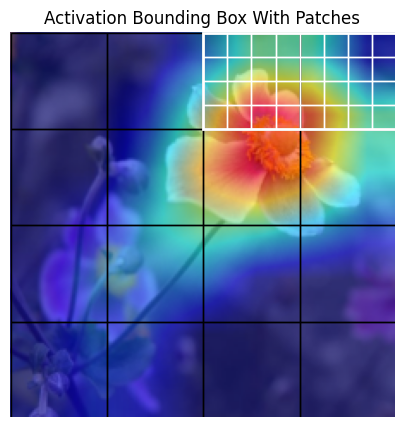

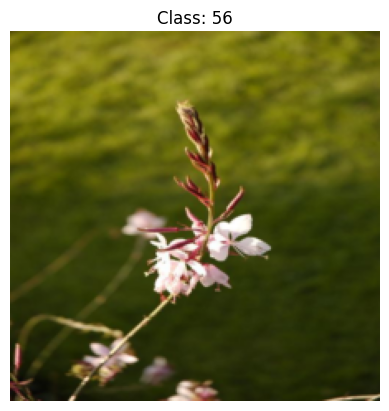

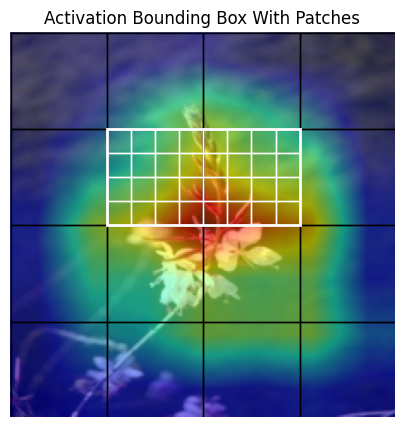

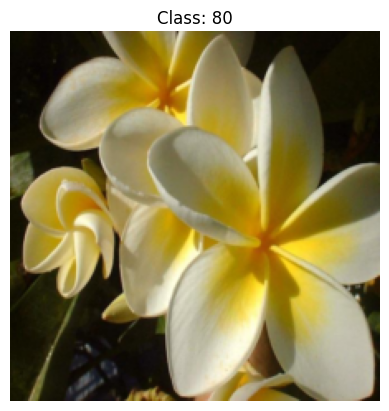

...

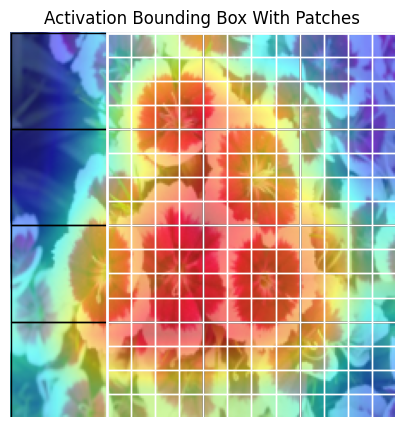

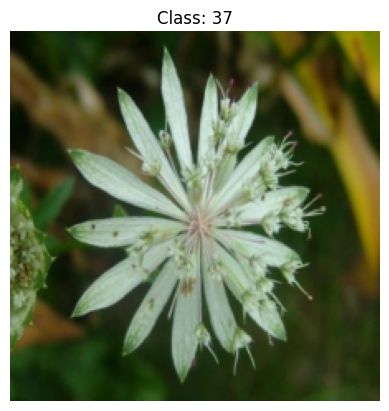

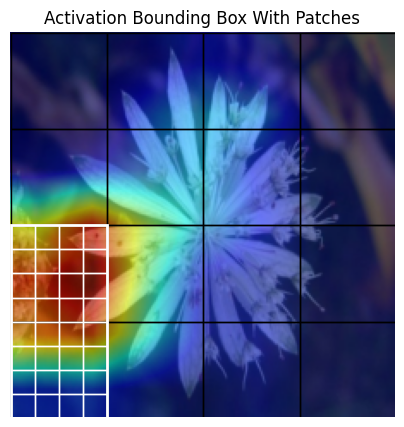

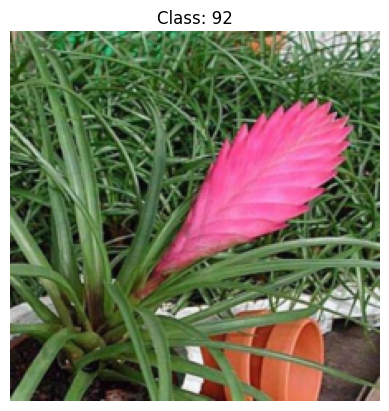

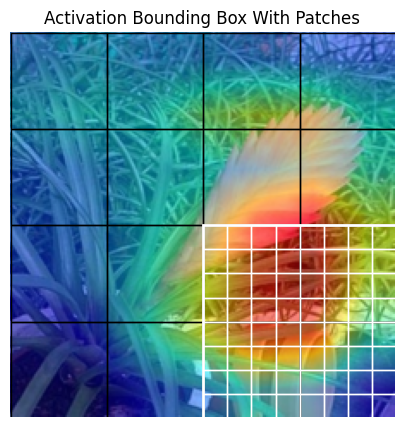

In [46]:
visualize_patching(model, patch_size = (14,14), bigger_grid_patch_size = (56, 56), threshold=150)

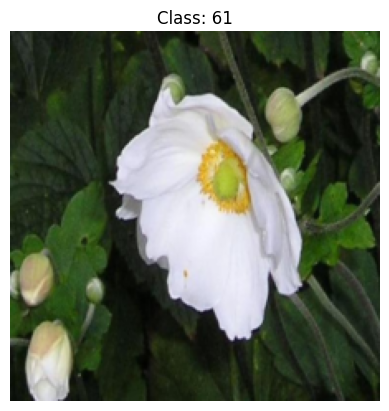

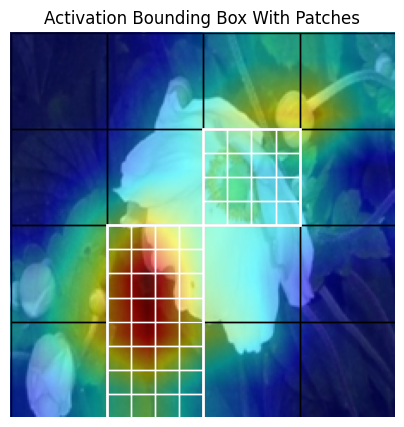

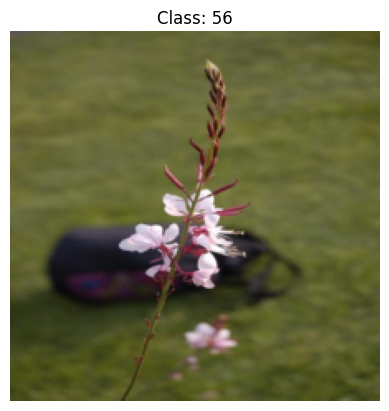

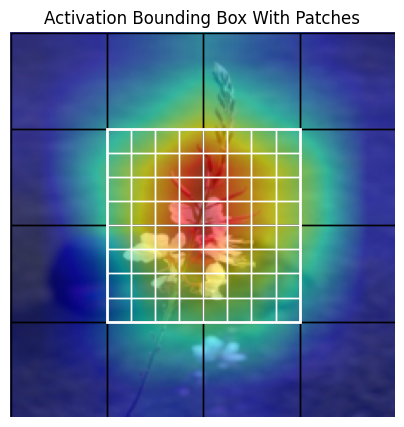

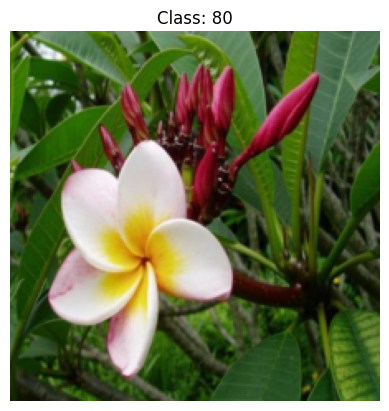

...

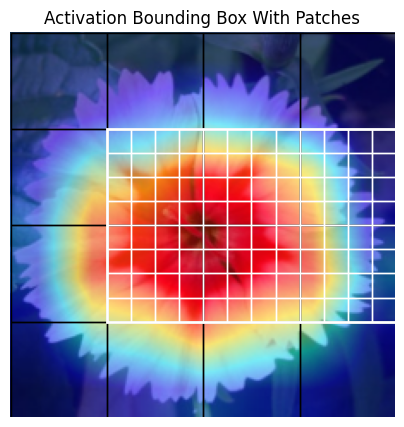

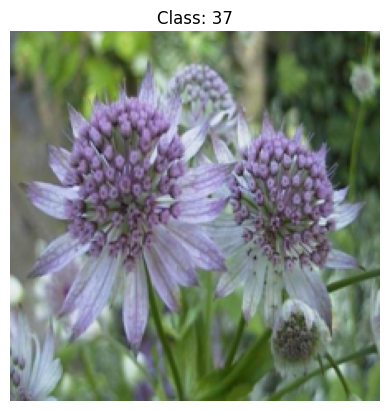

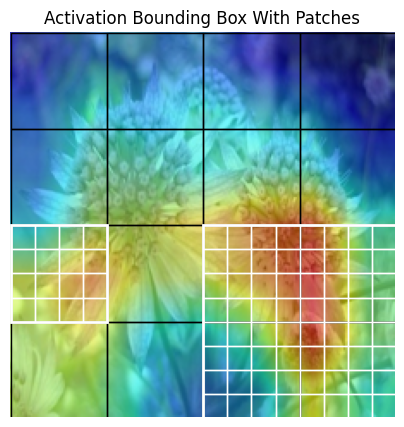

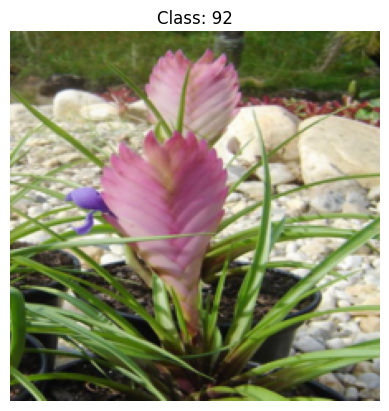

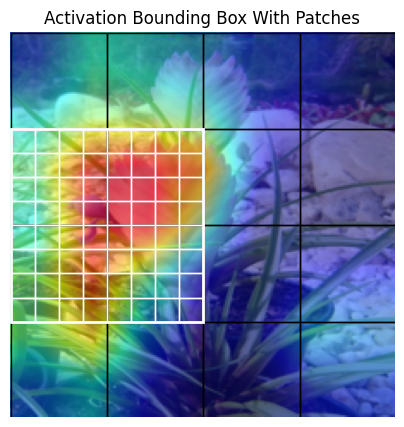

In [47]:
visualize_patching(model, patch_size = (14,14), bigger_grid_patch_size = (56, 56), threshold=150, mode='train')